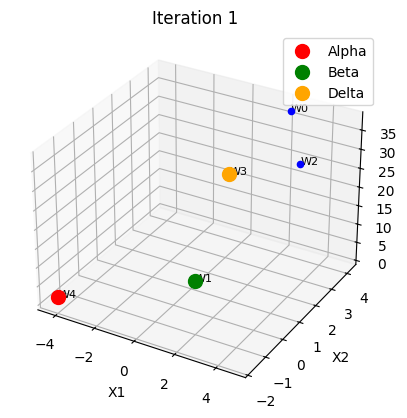

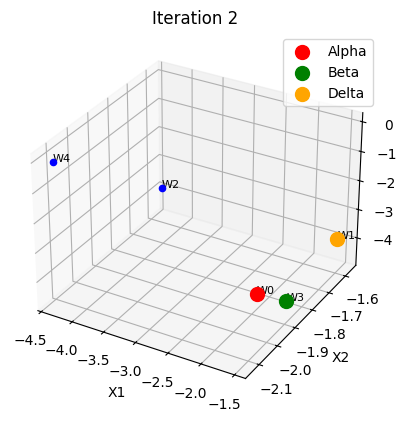

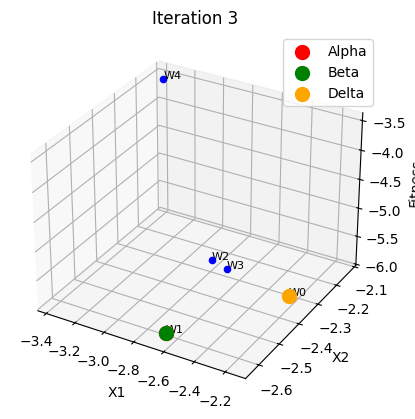

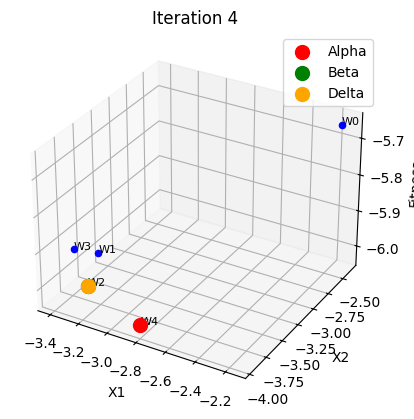

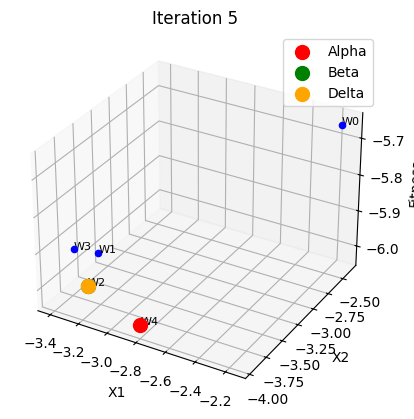

...

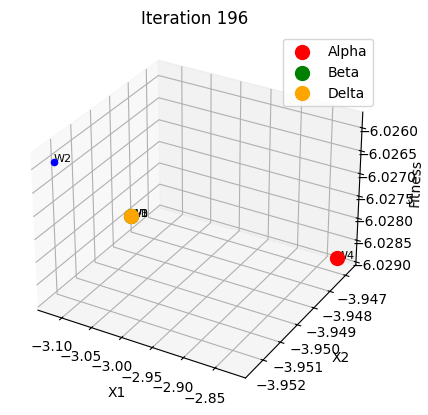

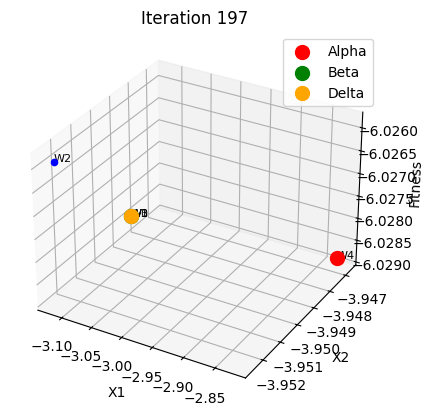

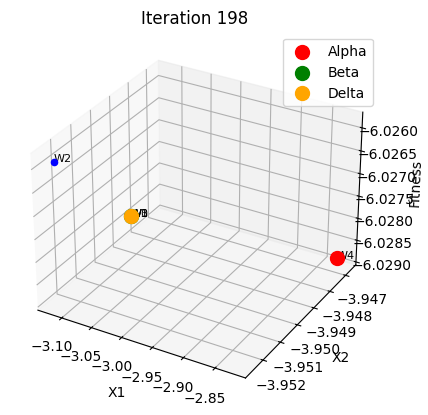

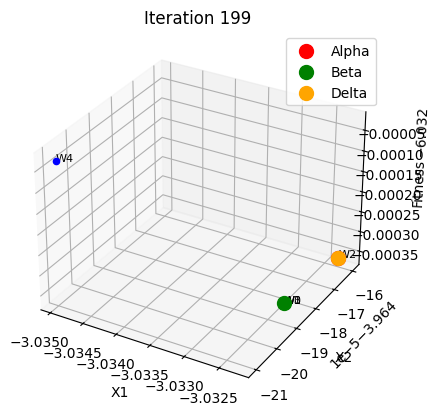

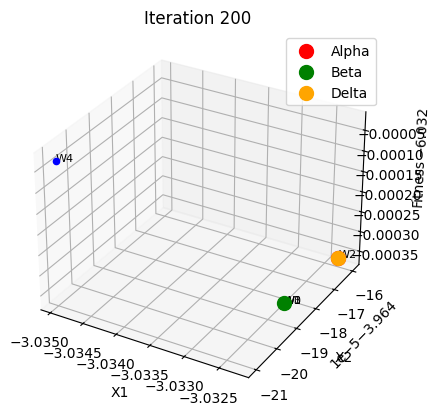

In [1]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Read data
with open("gwo_output.txt", "r") as f:
    lines = f.readlines()

iterations = {}
specials = {"ALPHA": {}, "BETA": {}, "DELTA": {}}

for line in lines:
    parts = line.strip().split()
    if not parts:
        continue

    if parts[0] in ["ALPHA", "BETA", "DELTA"]:
        label, it = parts[0], int(parts[1])
        x, y, f = float(parts[3]), float(parts[4]), float(parts[5])
        specials[label][it] = (x, y, f)
    else:
        it, pid = int(parts[0]), int(parts[1])
        x, y, f = float(parts[2]), float(parts[3]), float(parts[4])
        if it not in iterations:
            iterations[it] = []
        iterations[it].append((pid, x, y, f))

# Plot each iteration
for it, particles in iterations.items():
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    # Plot wolves
    for pid, x, y, f in particles:
        ax.scatter(x, y, f, color="blue")
        ax.text(x, y, f, f"W{pid}", fontsize=8)

    # Highlight alpha, beta, delta
    if it in specials["ALPHA"]:
        ax.scatter(*specials["ALPHA"][it], color="red", s=100, label="Alpha")
    if it in specials["BETA"]:
        ax.scatter(*specials["BETA"][it], color="green", s=100, label="Beta")
    if it in specials["DELTA"]:
        ax.scatter(*specials["DELTA"][it], color="orange", s=100, label="Delta")

    ax.set_title(f"Iteration {it}")
    ax.set_xlabel("X1")
    ax.set_ylabel("X2")
    ax.set_zlabel("Fitness")
    ax.legend()
    plt.show()
